<a href="https://colab.research.google.com/github/Chaidir110/PCVK_Ganjil_2025/blob/main/week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

import cv2
import matplotlib.pylab as plt
import numpy as np
from google.colab.patches import cv2_imshow

Mounted at /content/drive


mengubah tingkat kecerahan citra
--------------------------------
masukan nilai kecerahan: 50


/tmp/ipython-input-1992321003.py:15: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


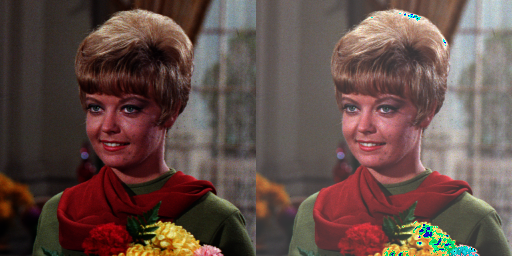

In [ ]:
print('mengubah tingkat kecerahan citra')
print('--------------------------------')
try:
  brightness = int(input('masukan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv2.imread('/content/drive/MyDrive/RPL/PCVK/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


final_frame = cv2.hconcat((original, brightness_image))
cv2_imshow(final_frame)

# **Tugas Praktikum D1**

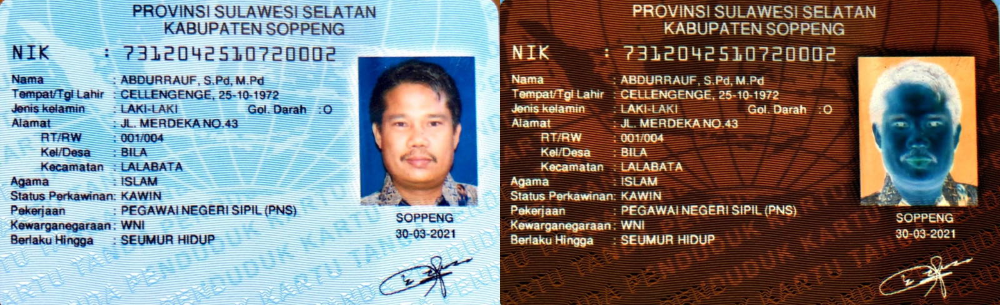

In [ ]:
original = cv2.imread('/content/drive/MyDrive/RPL/PCVK/KTP7.jpeg')
inverse_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      inverse_image[y, x, c] = 255 - original[y, x, c]


final_frame = cv2.hconcat((original, inverse_image))
cv2_imshow(final_frame)

Transformasi Kontras
--------------------
Masukkan nilai brightness: 50
Masukkan kontras: 2


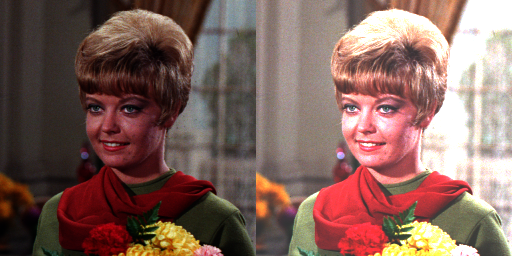

In [ ]:
print("Transformasi Kontras")
print("--------------------")

# Input faktor kontras
try:
    brightness = int(input("Masukkan nilai brightness: "))
    kontras = float(input("Masukkan kontras: "))
except ValueError:
    print("Error, input tidak valid. Gunakan angka.")

original = cv2.imread('/content/drive/MyDrive/RPL/PCVK/female.tiff')
contrast_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      contrast_image[y,x,c] = np.clip(kontras * original[y, x, c] + brightness, 0, 255)


final_frame = cv2.hconcat((original, contrast_image))
cv2_imshow(final_frame)

Transformasi Logarithmic Brightness
-----------------------------------
Masukkan nilai brightness: 50


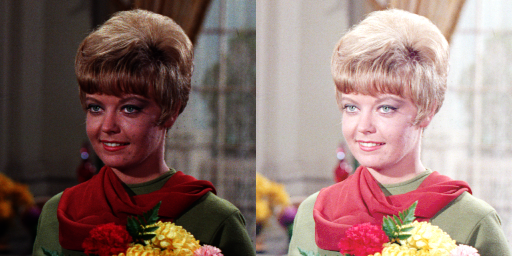

In [ ]:
print("Transformasi Logarithmic Brightness")
print("-----------------------------------")

# Input faktor kontras
try:
    c = int(input("Masukkan nilai brightness: "))
except ValueError:
    print("Error, input tidak valid. Gunakan angka.")

# Baca gambar (mode grayscale agar lebih jelas efeknya)
original = cv2.imread('/content/drive/MyDrive/RPL/PCVK/female.tiff')
log_image = np.zeros(original.shape, original.dtype)



for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for z in range(original.shape[2]):
      log_image[y,x,z] = np.clip(c*np.log(1 + original[y,x,z]), 0, 255)


final_frame = cv2.hconcat([original, log_image])
cv2_imshow(final_frame)

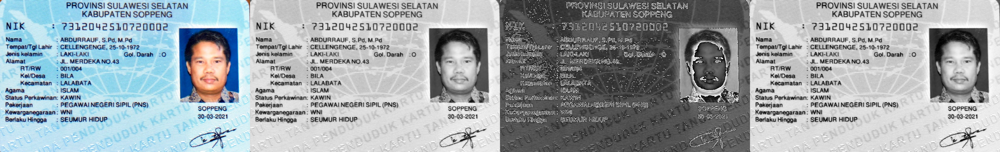

In [ ]:
original = cv2.imread('/content/drive/MyDrive/RPL/PCVK/KTP7.jpeg')
gray_avg = np.zeros(original.shape, original.dtype)
gray_lightness = np.zeros(original.shape, original.dtype)
gray_luminance = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):

      gray_avg[y,x] = np.mean(original[y, x])
      gray_lightness[y,x] = np.max(original[y, x]) + np.min(original[y, x]) / 2
      gray_luminance[y,x] = 0.21 * original[y, x, 2] + 0.72 * original[y, x, 1] + 0.07 * original[y, x, 0]


final_frame = cv2.hconcat((original, gray_avg, gray_lightness, gray_luminance))
cv2_imshow(final_frame)

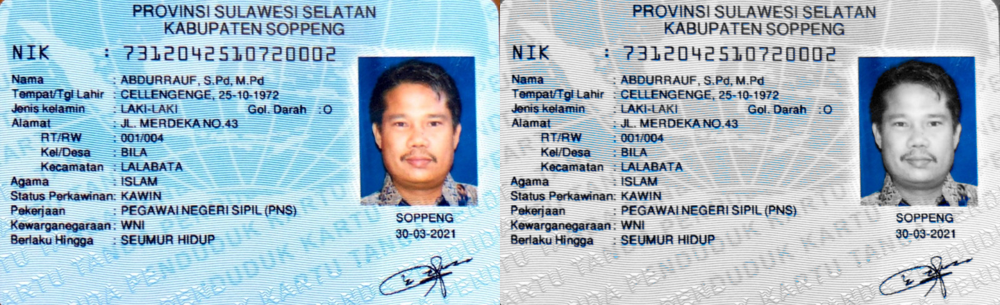

In [ ]:
original = cv2.imread('/content/drive/MyDrive/RPL/PCVK/KTP7.jpeg')

# Konversi ke HSV
hsv = cv2.cvtColor(original, cv2.COLOR_BGR2HSV)

# Rentang warna biru (silakan sesuaikan kalau kurang pas)
lower_blue = np.array([90, 126, 56, ])
upper_blue = np.array([130, 255, 255])

# Buat mask warna biru
mask = cv2.inRange(hsv, lower_blue, upper_blue)

# Konversi citra ke grayscale
gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
gray_bgr = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

# Gabungkan: biru tetap berwarna, lainnya grayscale
result = np.where(mask[..., None] != 0, original, gray_bgr)

# Gabungkan hasil samping-sampingan untuk perbandingan
final_frame = cv2.hconcat((original, result))
cv2_imshow(final_frame)

Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 3


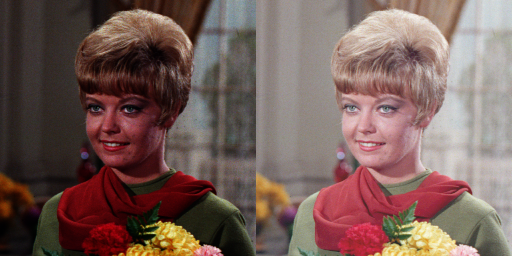

In [ ]:
print('Gamma Correction pada citra')
print('----------------------------------')

try:
    gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')
    #gamma = 1.0

original = cv2.imread('/content/drive/MyDrive/RPL/PCVK/female.tiff')
gamma_correction = np.zeros(original.shape, dtype=np.uint8)

# Akses per pixel (pakai rumus gamma correction)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            normalized = original[y, x, c] / 255.0
            correction = 255 * (normalized ** (1 / gamma))
            gamma_correction[y, x, c] = np.clip(correction, 0, 255)

# Gabungkan hasil
final_frame = cv2.hconcat((original, gamma_correction))
cv2_imshow(final_frame)

Simulasi Image Depth
-----------------------------------


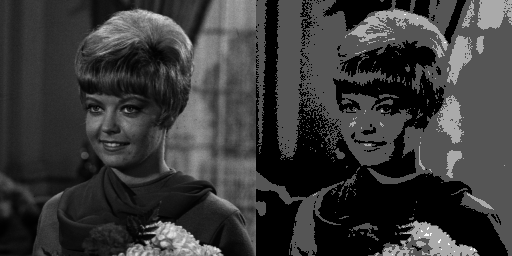

In [ ]:
print("Simulasi Image Depth")
print("-----------------------------------")

bit_depth = 2

levels = 255 / (pow(2, bit_depth)-1)

original = cv2.imread('/content/drive/MyDrive/RPL/PCVK/female.tiff', cv2.IMREAD_GRAYSCALE)

# Buat citra iamge depth
image_depth = np.floor(original / step + 0.5) * step
image_depth = np.clip(image_depth, 0, 255).astype(np.uint8)


final_frame = cv2.hconcat((original, image_depth))
cv2_imshow(final_frame)

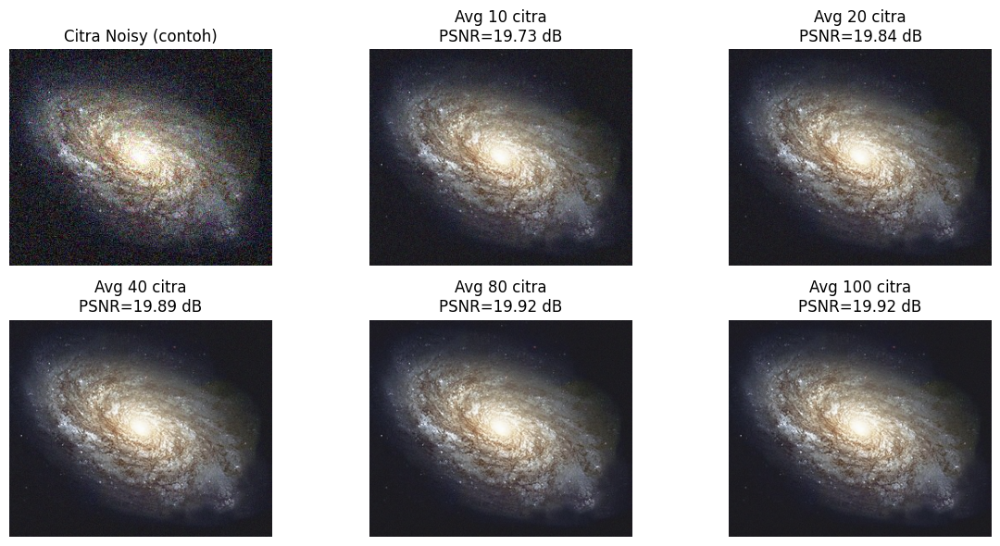

Jumlah 10 citra -> PSNR: 19.73 dB
Jumlah 20 citra -> PSNR: 19.84 dB
Jumlah 40 citra -> PSNR: 19.89 dB
Jumlah 80 citra -> PSNR: 19.92 dB
Jumlah 100 citra -> PSNR: 19.92 dB


In [24]:
import cv2 as cv
import numpy as np
import glob
import matplotlib.pyplot as plt

# Fungsi untuk menghitung PSNR
def psnr(img1, img2):
    mse = np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)
    if mse == 0:
        return float('inf')
    PIXEL_MAX = 255.0
    return 10 * np.log10((PIXEL_MAX ** 2) / mse)

# Baca citra asli (ground truth)
img_asli = cv.imread('/content/drive/MyDrive/RPL/PCVK/galaxy.jpg', cv.IMREAD_COLOR)

# Baca semua citra noisy
cv_img = []
for img in glob.glob('/content/drive/MyDrive/RPL/PCVK/noises/*.jpg'):
    n = cv.imread(img, cv.IMREAD_COLOR)
    cv_img.append(n)

cv_img = np.array(cv_img, dtype=np.float32)   # konversi ke array float agar bisa dihitung rata-rata

# Tentukan jumlah citra yang mau di-average
jumlah_list = [10, 20, 40, 80, 100]
hasil_avg = []   # untuk menyimpan hasil

# Proses average denoising
for j in jumlah_list:
    # Ambil j citra pertama dan hitung rata-rata piksel
    avg_img = np.mean(cv_img[:j], axis=0)
    avg_img = np.clip(avg_img, 0, 255).astype(np.uint8)

    # Hitung PSNR dibanding citra asli
    nilai_psnr = psnr(img_asli, avg_img)

    # Simpan hasil
    hasil_avg.append((j, avg_img, nilai_psnr))

# Visualisasi hasil
plt.figure(figsize=(12,6))

# tampilkan contoh citra noisy pertama
plt.subplot(2,3,1)
plt.imshow(cv.cvtColor(cv_img[0].astype(np.uint8), cv.COLOR_BGR2RGB))
plt.title("Citra Noisy (contoh)")
plt.axis("off")

# tampilkan hasil average untuk berbagai jumlah citra
for i, (j, avg_img, nilai_psnr) in enumerate(hasil_avg, start=2):
    plt.subplot(2,3,i)
    plt.imshow(cv.cvtColor(avg_img, cv.COLOR_BGR2RGB))
    plt.title(f"Avg {j} citra\nPSNR={nilai_psnr:.2f} dB")
    plt.axis("off")

plt.tight_layout()
plt.show()

# Print nilai PSNR ke terminal
for j, _, nilai_psnr in hasil_avg:
    print(f"Jumlah {j} citra -> PSNR: {nilai_psnr:.2f} dB")


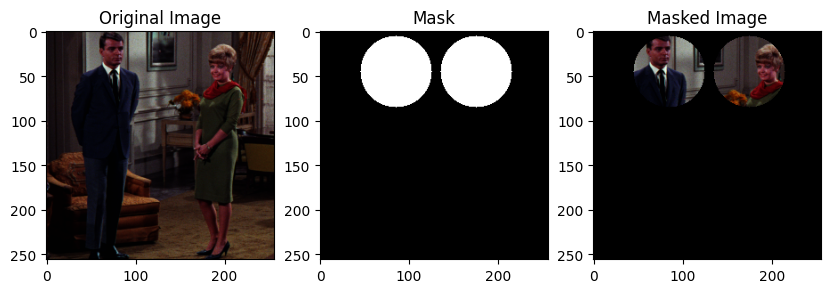

In [2]:
image = cv2.imread('/content/drive/MyDrive/RPL/PCVK/couple.tiff')

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

mask1 = np.zeros(image_rgb.shape[:2], dtype="uint8")
cv2.circle(mask1, (85, 45), 40, 255, -1)  # Posisi di wajah orang kiri

mask2 = np.zeros(image_rgb.shape[:2], dtype="uint8")
cv2.circle(mask2, (175, 45), 40, 255, -1)  # Posisi di wajah orang kanan

combined_mask = cv2.bitwise_or(mask1, mask2)

masked_image = cv2.bitwise_and(image_rgb, image_rgb, mask=combined_mask)

plt.figure(figsize=(10, 4))

plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(combined_mask, cmap='gray')
plt.title('Mask')

plt.subplot(1, 3, 3)
plt.imshow(masked_image)
plt.title('Masked Image')
plt.show()

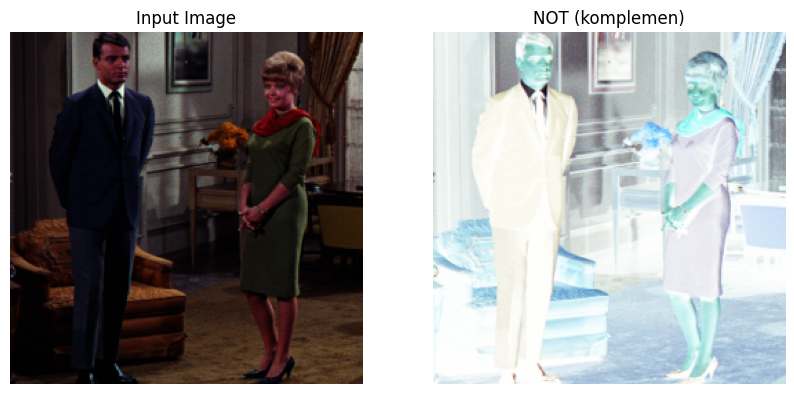

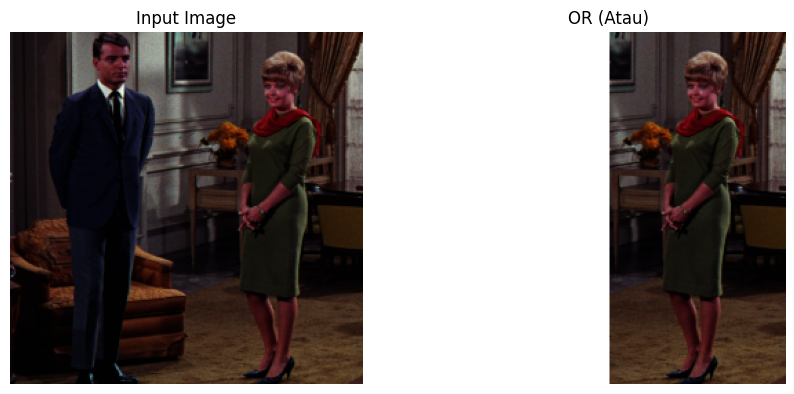

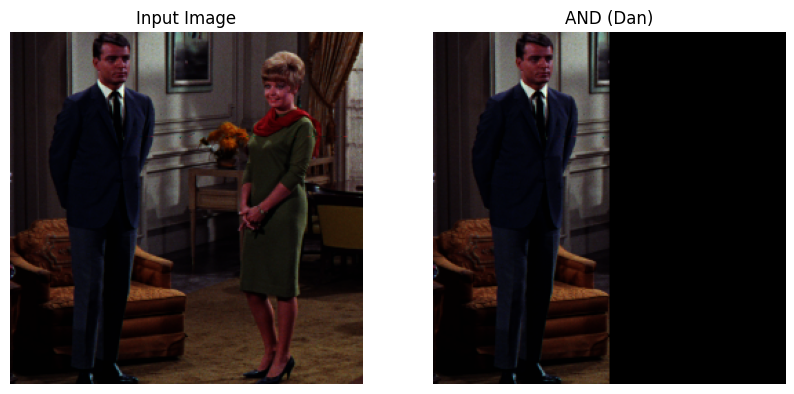

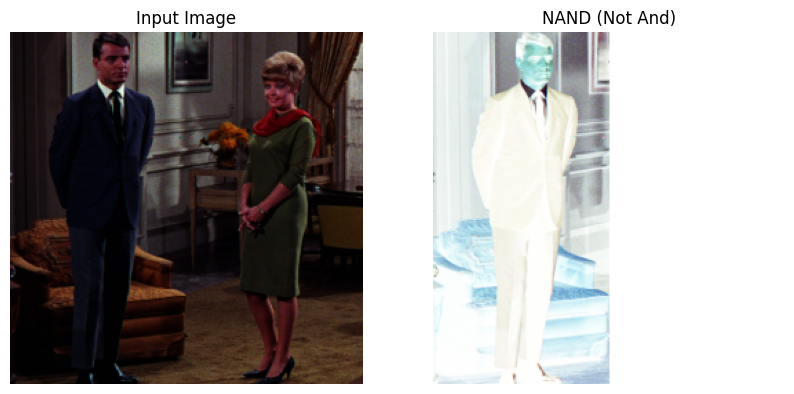

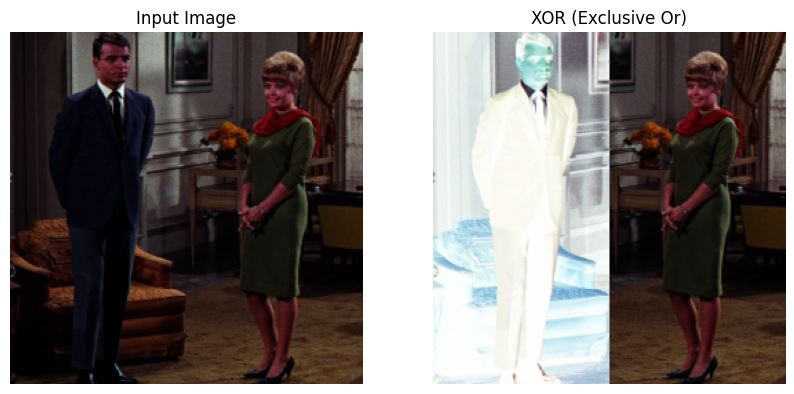

In [4]:
def show_images(title1, image1, title2, image2):
    plt.figure(figsize=(10,5))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)), plt.title(title1), plt.axis('off')
    plt.subplot(122), plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)), plt.title(title2), plt.axis('off')
    plt.show()

img = cv2.imread('/content/drive/MyDrive/RPL/PCVK/couple.tiff')

mask = np.zeros(img.shape, dtype=np.uint8)
mask[:, :img.shape[1]//2] = 255

not_img = cv2.bitwise_not(img)
or_img = cv2.bitwise_or(img, mask)
and_img = cv2.bitwise_and(img, mask)
nand_img = cv2.bitwise_not(cv2.bitwise_and(img, mask))
xor_img = cv2.bitwise_xor(img, mask)

show_images("Input Image", img, "NOT (komplemen)", not_img)
show_images("Input Image", img, "OR (Atau)", or_img)
show_images("Input Image", img, "AND (Dan)", and_img)
show_images("Input Image", img, "NAND (Not And)", nand_img)
show_images("Input Image", img, "XOR (Exclusive Or)", xor_img)